<a href="https://colab.research.google.com/github/isaac-ik/Advanced-Statistical-Approaches-to-Quality/blob/main/Dry%20Bean%20classifiers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a target="_blank" href="https://colab.research.google.com/github/isaac-ik/Advanced-Statistical-Approaches-to-Quality/blob/main/Dry%20Bean%20classifiers.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

In [1]:
pip install pycaret

In [2]:
pip install pca

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 85.7 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.5
    Uninstalling matplotlib-3.7.5:
      Successfully uninstalled matplotlib-3.7.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.14.4 requires pandas>=2.2.0, but you have pandas 2.1.4 which is incompatible.
pycaret 3.3.2 requires matplotlib<3.8.0, but you have matplotlib 3.10.0 which is incompatible.


In [3]:
import pandas as pd
import numpy as np

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt

In [5]:
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

## Data Description

Images of 13,611 grains of 7 different registered dry beans were taken with a high-resolution camera. A total of 16 features; 12 dimensions and 4 shape forms, were obtained from the grains<br>

Link: https://archive.ics.uci.edu/dataset/602/dry+bean+dataset <br>

1.) Area (A): The area of a bean zone and the number of pixels within its boundaries.
<br>
2.) Perimeter (P): Bean circumference is defined as the length of its border.
<br>
3.) Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.<br>
4.) Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.<br>
5.) Aspect ratio (K): Defines the relationship between L and l.<br>
6.) Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.<br>
7.) Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.<br>
8.) Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.<br>
9.) Extent (Ex): The ratio of the pixels in the bounding box to the bean area.<br>
10.)Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.<br>
11.)Roundness (R): Calculated with the following formula: (4piA)/(P^2)<br>
12.)Compactness (CO): Measures the roundness of an object: Ed/L<br>
13.)ShapeFactor1 (SF1)<br>
14.)ShapeFactor2 (SF2)<br>
15.)ShapeFactor3 (SF3)<br>
16.)ShapeFactor4 (SF4)<br>


17.)Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

Data source: <br>

Murat KOKLU
Faculty of Technology,
Selcuk University,
TURKEY.
ORCID : 0000-0002-2737-2360
mkoklu@selcuk.edu.tr

Ilker Ali OZKAN
Faculty of Technology,
Selcuk University,
TURKEY.
ORCID : 0000-0002-5715-1040
ilkerozkan@selcuk.edu.tr


In [6]:
# Read dry bean data
data = pd.read_excel("https://github.com/isaac-ik/Advanced-Statistical-Approaches-to-Quality/raw/refs/heads/main/DryBeanDataset/Dry_Bean_Dataset.xlsx")

In [7]:
data

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


## Exploratory Data analysis

In [8]:
# Check the first few rows
print(data.head())

    Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0  28395    610.291       208.178117       173.888747      1.197191   
1  28734    638.018       200.524796       182.734419      1.097356   
2  29380    624.110       212.826130       175.931143      1.209713   
3  30008    645.884       210.557999       182.516516      1.153638   
4  30140    620.134       201.847882       190.279279      1.060798   

   Eccentricity  ConvexArea  EquivDiameter    Extent  Solidity  roundness  \
0      0.549812       28715     190.141097  0.763923  0.988856   0.958027   
1      0.411785       29172     191.272750  0.783968  0.984986   0.887034   
2      0.562727       29690     193.410904  0.778113  0.989559   0.947849   
3      0.498616       30724     195.467062  0.782681  0.976696   0.903936   
4      0.333680       30417     195.896503  0.773098  0.990893   0.984877   

   Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  Class  
0     0.913358      0.007332  

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [10]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,13611.0,53048.284549,29324.095717,20420.000000,36328.000000,44652.000000,61332.000000,254616.000000
Perimeter,13611.0,855.283459,214.289696,524.736000,703.523500,794.941000,977.213000,1985.370000
MajorAxisLength,13611.0,320.141867,85.694186,183.601165,253.303633,296.883367,376.495012,738.860153
MinorAxisLength,13611.0,202.270714,44.970091,122.512653,175.848170,192.431733,217.031741,460.198497
AspectRation,13611.0,1.583242,0.246678,1.024868,1.432307,1.551124,1.707109,2.430306
Eccentricity,13611.0,0.750895,0.092002,0.218951,0.715928,0.764441,0.810466,0.911423
ConvexArea,13611.0,53768.200206,29774.915817,20684.000000,36714.500000,45178.000000,62294.000000,263261.000000
EquivDiameter,13611.0,253.064220,59.177120,161.243764,215.068003,238.438026,279.446467,569.374358
Extent,13611.0,0.749733,0.049086,0.555315,0.718634,0.759859,0.786851,0.866195
Solidity,13611.0,0.987143,0.004660,0.919246,0.985670,0.988283,0.990013,0.994677


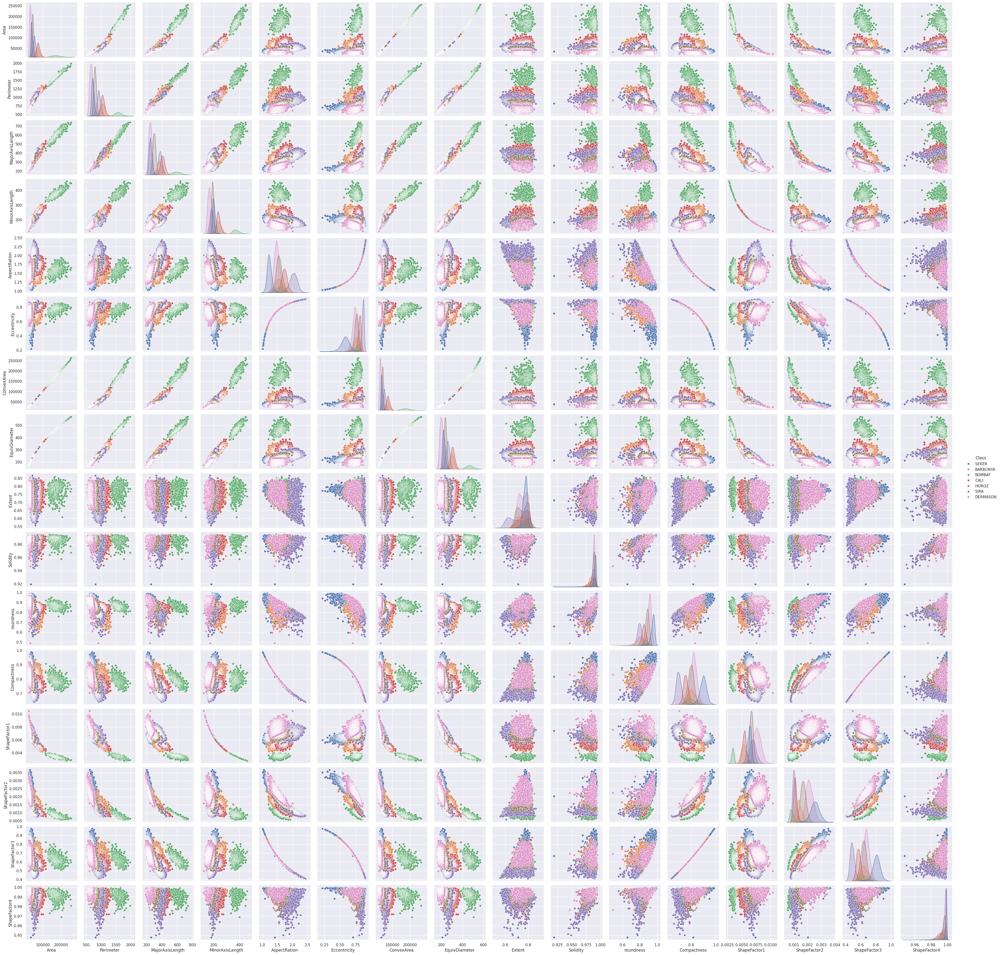

In [11]:
sns.pairplot(data, hue='Class')
plt.show()

In [12]:
# Separate features and target
X = data.drop(columns=['Class'])
y = data['Class']

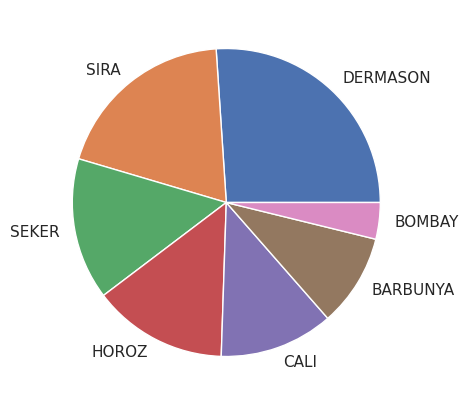

In [13]:
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

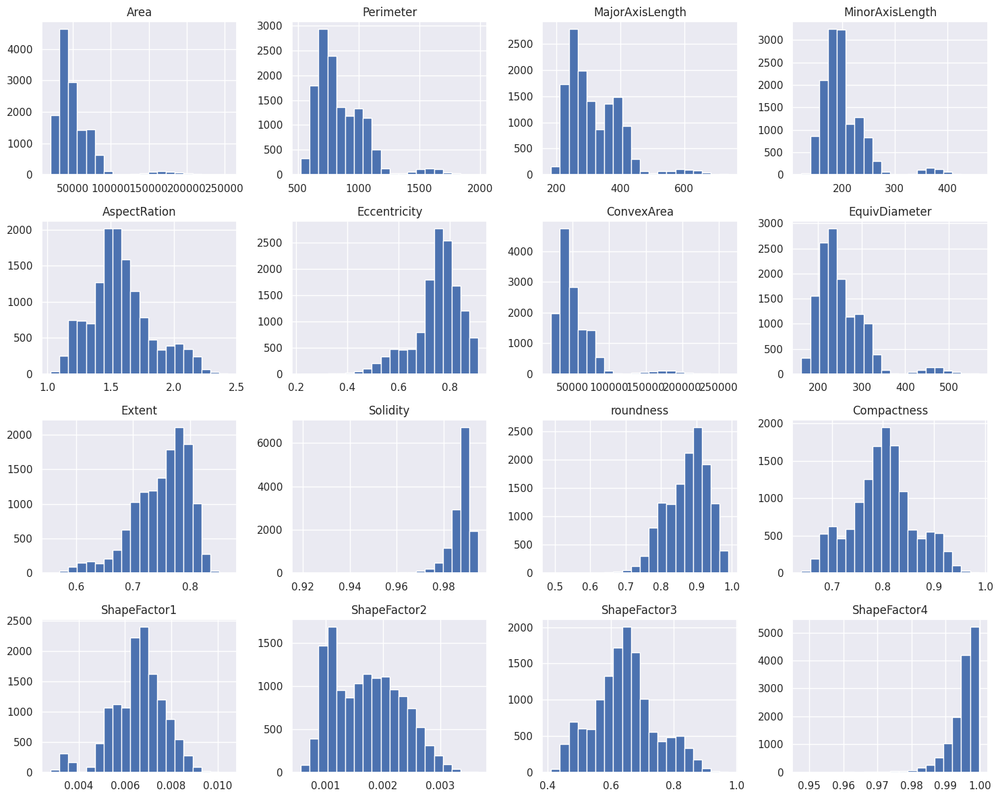

In [14]:
# Plot histograms for each feature
data.hist(figsize=(15, 12), bins=20)
plt.tight_layout()
plt.show()

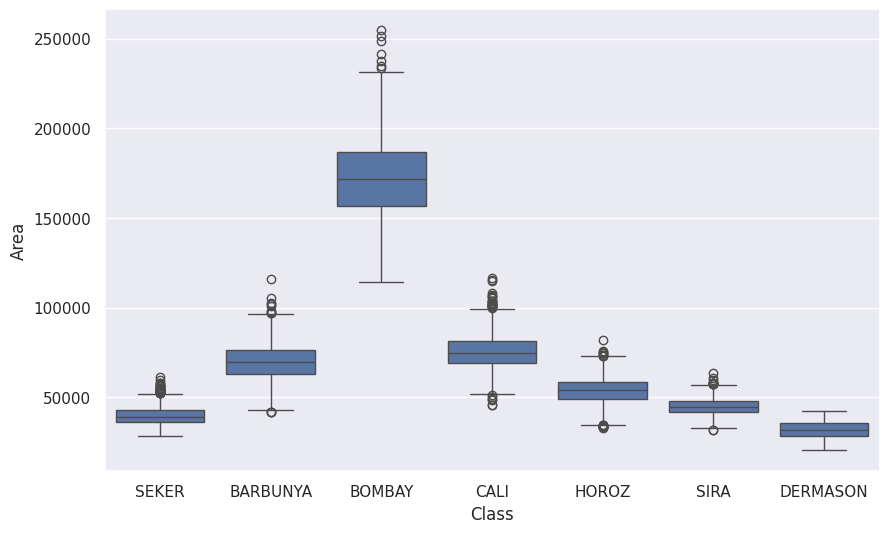

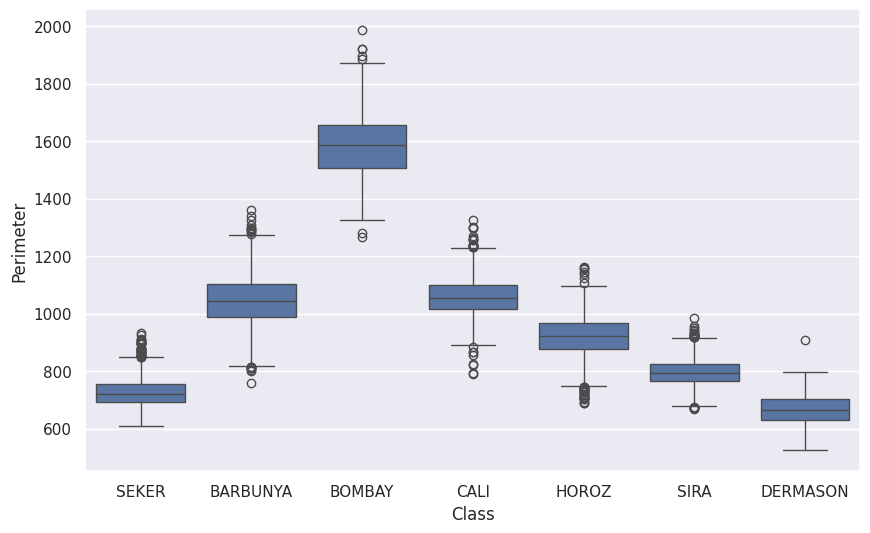

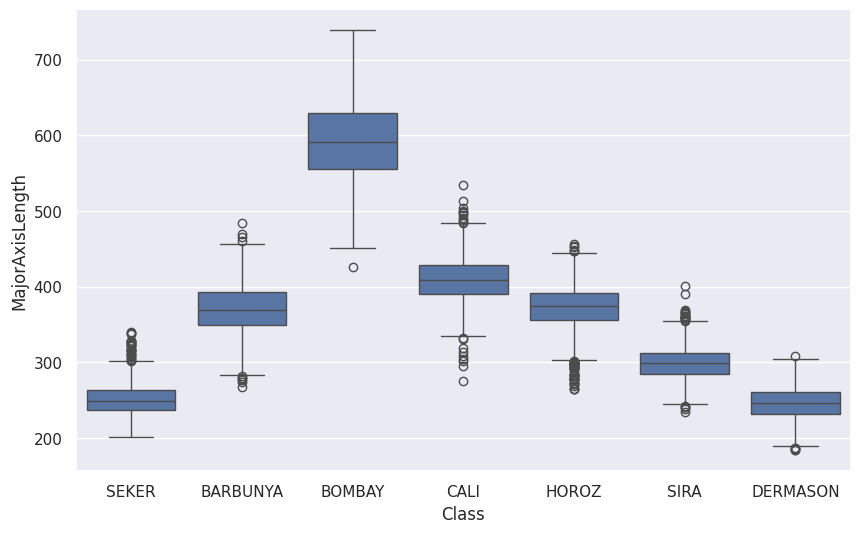

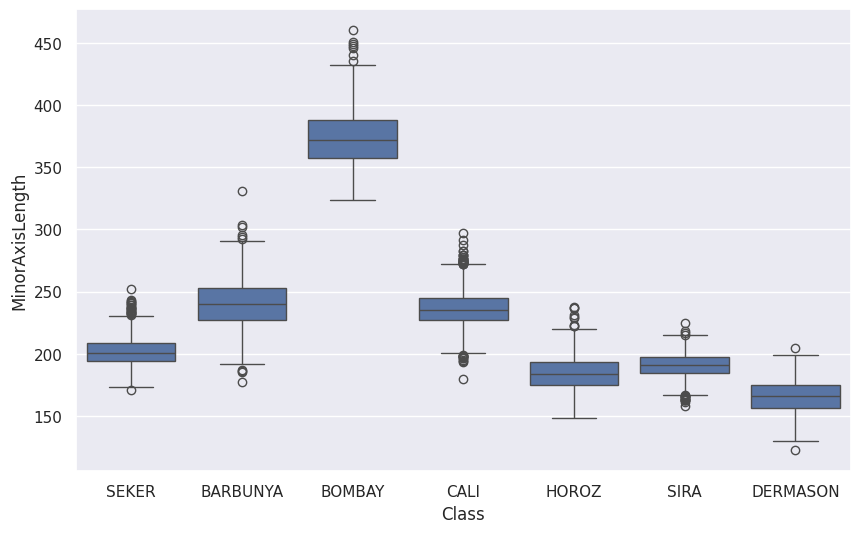

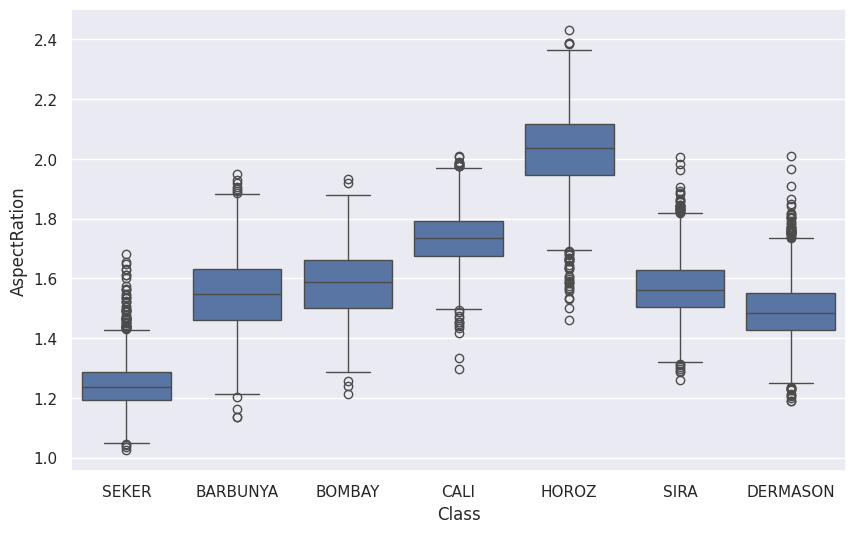

...

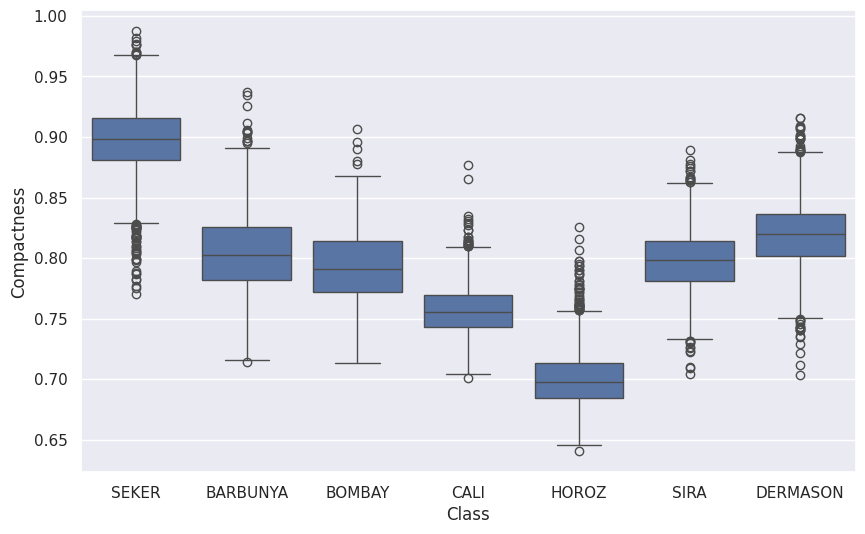

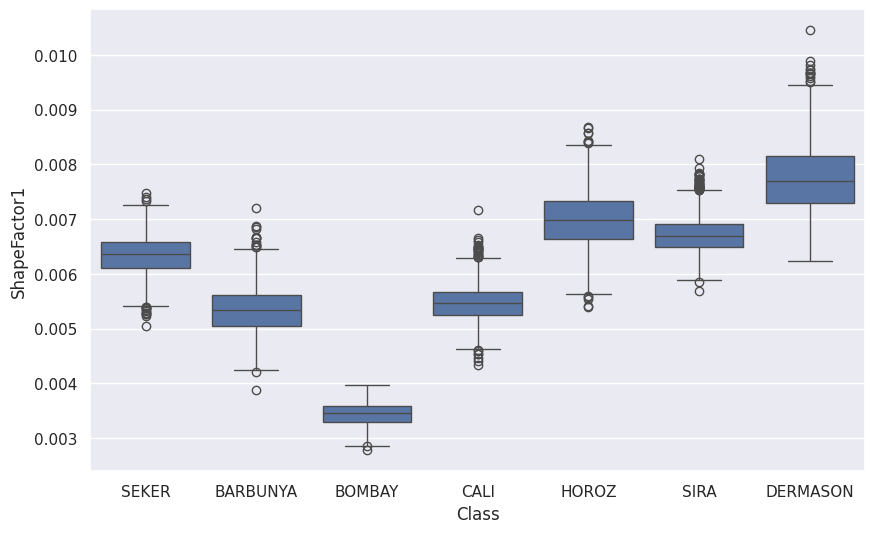

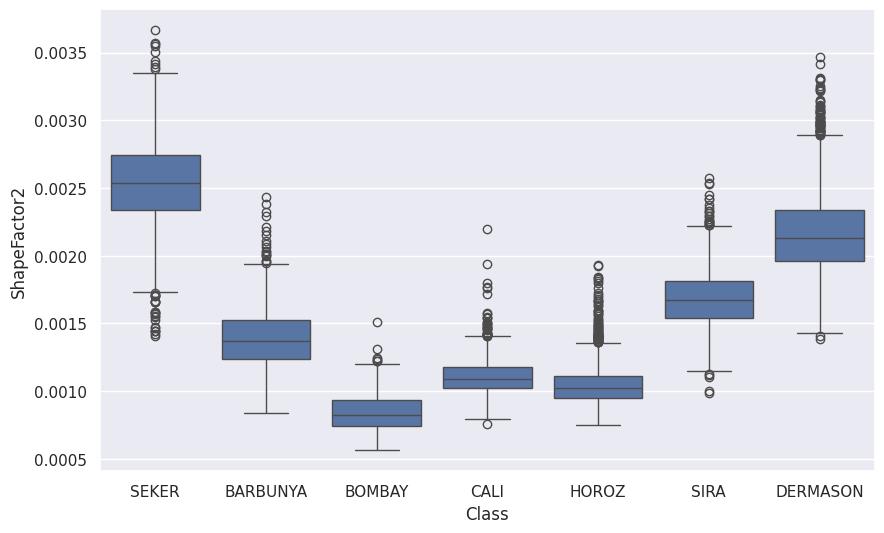

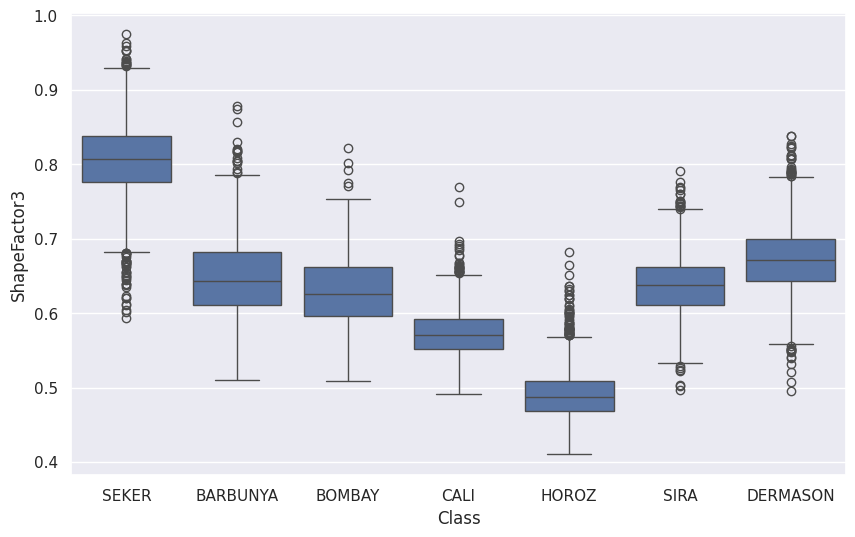

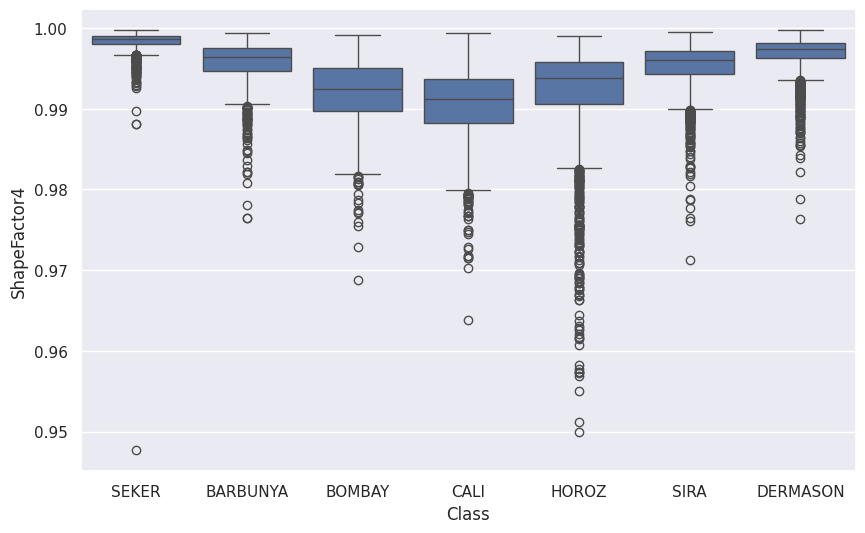

In [15]:
# Boxplots to show the distribution of features by class
for feature in data.drop(['Class'], axis=1).columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Class', y=feature, data=data)
    plt.show()


In [16]:
# Encode the target variable (e.g., 'SEKER' -> 0, etc.)
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
print(f"Classes: {label_encoder.classes_}")

Classes: ['BARBUNYA' 'BOMBAY' 'CALI' 'DERMASON' 'HOROZ' 'SEKER' 'SIRA']


In [17]:
# Map classes to its number represntation
label_name_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

In [18]:
label_name_mapping

{'BARBUNYA': 0,
 'BOMBAY': 1,
 'CALI': 2,
 'DERMASON': 3,
 'HOROZ': 4,
 'SEKER': 5,
 'SIRA': 6}

In [19]:
y_encoded

array([5, 5, 5, ..., 3, 3, 3])

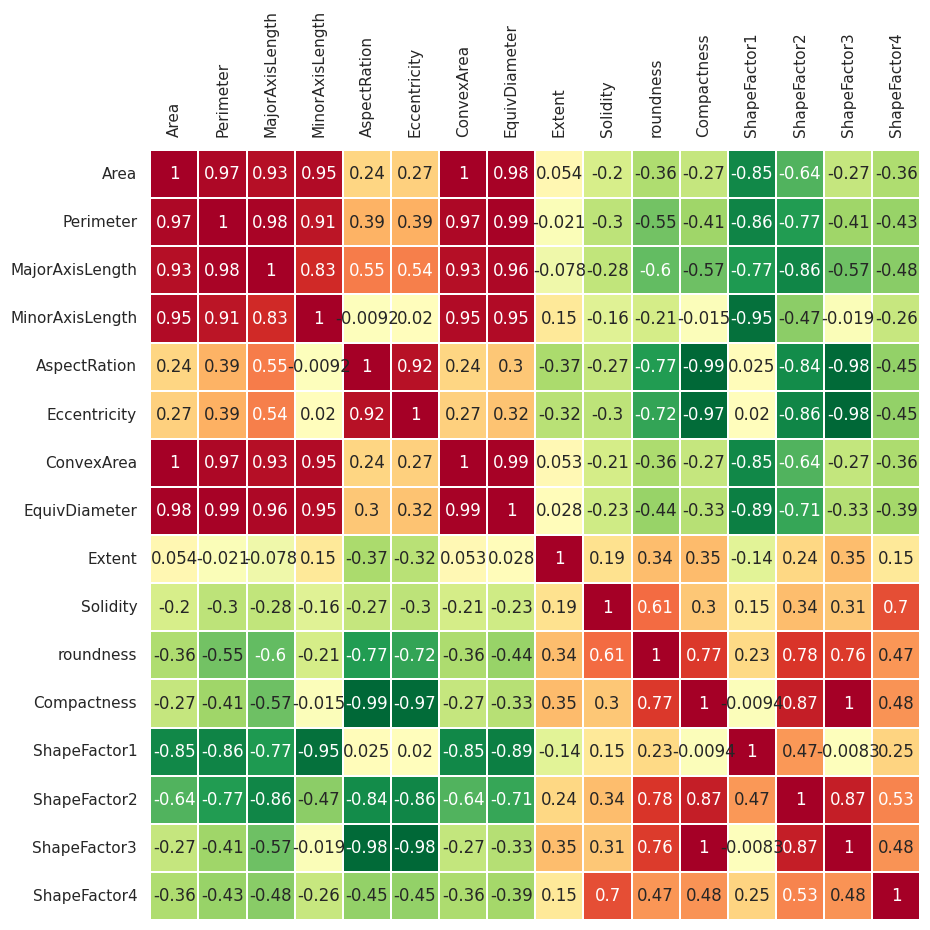

In [20]:
# Correlation matrix
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

In [21]:
X.corr()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,1.000000,0.966722,0.931834,0.951602,0.241735,0.267481,0.999939,0.984968,0.054345,-0.196585,-0.357530,-0.268067,-0.847958,-0.639291,-0.272145,-0.355721
Perimeter,0.966722,1.000000,0.977338,0.913179,0.385276,0.391066,0.967689,0.991380,-0.021160,-0.303970,-0.547647,-0.406857,-0.864623,-0.767592,-0.408435,-0.429310
MajorAxisLength,0.931834,0.977338,1.000000,0.826052,0.550335,0.541972,0.932607,0.961733,-0.078062,-0.284302,-0.596358,-0.568377,-0.773609,-0.859238,-0.568185,-0.482527
MinorAxisLength,0.951602,0.913179,0.826052,1.000000,-0.009161,0.019574,0.951339,0.948539,0.145957,-0.155831,-0.210344,-0.015066,-0.947204,-0.471347,-0.019326,-0.263749
AspectRation,0.241735,0.385276,0.550335,-0.009161,1.000000,0.924293,0.243301,0.303647,-0.370184,-0.267754,-0.766979,-0.987687,0.024593,-0.837841,-0.978592,-0.449264
Eccentricity,0.267481,0.391066,0.541972,0.019574,0.924293,1.000000,0.269255,0.318667,-0.319362,-0.297592,-0.722272,-0.970313,0.019920,-0.860141,-0.981058,-0.449354
ConvexArea,0.999939,0.967689,0.932607,0.951339,0.243301,0.269255,1.000000,0.985226,0.052564,-0.206191,-0.362083,-0.269922,-0.847950,-0.640862,-0.274024,-0.362049
EquivDiameter,0.984968,0.991380,0.961733,0.948539,0.303647,0.318667,0.985226,1.000000,0.028383,-0.231648,-0.435945,-0.327650,-0.892741,-0.713069,-0.330389,-0.392512
Extent,0.054345,-0.021160,-0.078062,0.145957,-0.370184,-0.319362,0.052564,0.028383,1.000000,0.191389,0.344411,0.354212,-0.141616,0.237956,0.347624,0.148502
Solidity,-0.196585,-0.303970,-0.284302,-0.155831,-0.267754,-0.297592,-0.206191,-0.231648,0.191389,1.000000,0.607150,0.303766,0.153388,0.343559,0.307662,0.702163


In [22]:
# Standardize the numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [23]:
# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)


## Principal Component Analysis (PCA)

In [24]:
# Apply PCA
pca = PCA()
Z = pca.fit_transform(X_scaled)

In [25]:
Z

array([[-4.98156099e+00,  1.82469731e+00,  7.49021037e-01, ...,
        -6.16118162e-04, -2.11823131e-03, -3.97991012e-04],
       [-5.43679225e+00,  2.93236480e+00,  2.18237398e+00, ...,
         4.80626800e-03,  2.27428496e-03, -3.12223898e-03],
       [-4.75808830e+00,  1.82688385e+00,  5.14037599e-01, ...,
         9.71269698e-04, -2.48858472e-03, -2.16616900e-04],
       ...,
       [-1.41751472e+00,  1.41193703e-01, -3.87206350e-01, ...,
        -4.17719573e-04,  9.87194155e-04, -3.20956338e-04],
       [-1.11466584e+00, -2.12679323e-01,  1.44088308e-01, ...,
        -1.23647569e-03,  1.31750687e-03, -4.93277749e-04],
       [-7.66436864e-01, -6.46514107e-01, -9.94121567e-01, ...,
         8.39075166e-04, -4.81904320e-05,  7.29007389e-04]])

In [26]:
class_labels = y.unique()
class_colors = {label: idx for idx, label in enumerate(class_labels)}
y_encoded = y.map(class_colors)

In [27]:
# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

In [28]:
# Determine the optimal number of components
n_components_95 = np.argmax(np.cumsum(explained_variance_ratio) >= 0.95) + 1
print(f"Number of PCs for 95% variance: {n_components_95}")

# Refit PCA with the optimal number of components for visualization (2 components)
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_scaled)

Number of PCs for 95% variance: 4


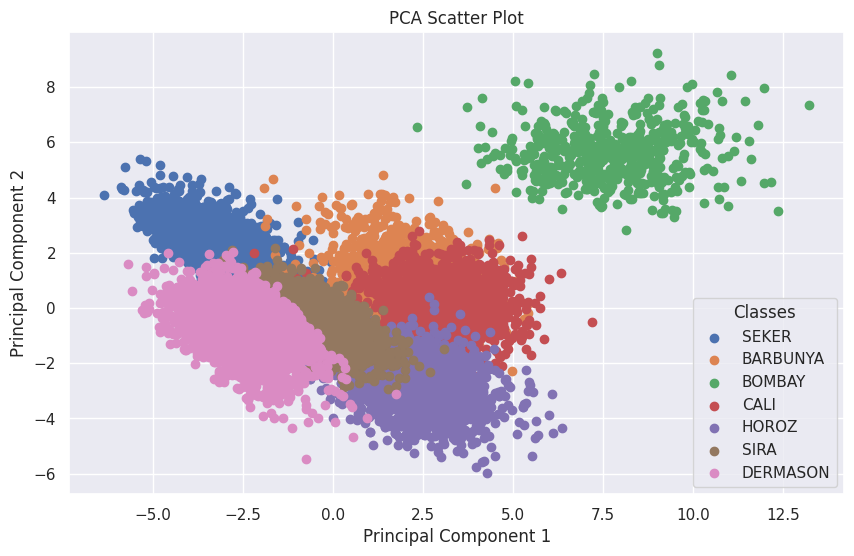

In [29]:
# Scatter plot of first two PCs
plt.figure(figsize=(10, 6))
for label, color_idx in class_colors.items():
    plt.scatter(
        X_pca_2d[y_encoded == color_idx, 0],
        X_pca_2d[y_encoded == color_idx, 1],
        label=label
    )
plt.title('PCA Scatter Plot')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.legend(title="Classes")
plt.show()

### Scree plot


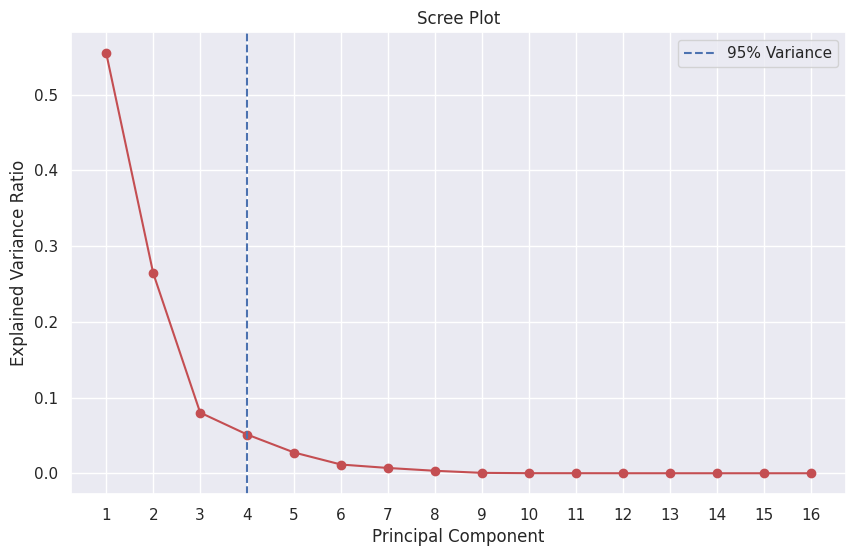

In [30]:
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(explained_variance_ratio) + 1),
    explained_variance_ratio,
    marker='o',
    color='r'
)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.axvline(
    x=np.argmax(np.cumsum(explained_variance_ratio) >= 0.95) + 1,
    color='b',
    linestyle='--',
    label='95% Variance'
)
plt.grid(True)
plt.legend()
plt.show()


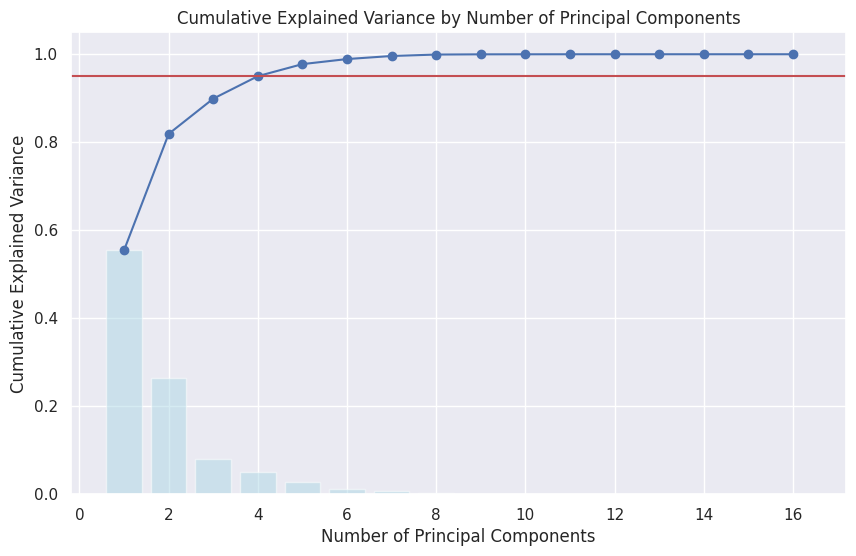

In [31]:
# Plot cumulative variance
plt.figure(figsize=(10, 6))

plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', color='b')
plt.axhline(y=0.95, color='r', linestyle='-')  # 95% variance line
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.5, color='lightblue', label='Explained Variance Ratio')

plt.title('Cumulative Explained Variance by Number of Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [32]:
variables = X.columns  # Save feature names

In [33]:
# Initialize and perform PCA
from pca import pca
model = pca()  # By default, keeps all principal components
out = model.fit_transform(X_scaled)

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [16] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [4] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [16] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[4]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


In [34]:
# Access Principal Components
print(out['PC'])  # Principal component scores

            PC1       PC2       PC3       PC4
0     -4.981561  1.824697  0.749021 -0.390812
1     -5.436792  2.932365  2.182374 -0.431960
2     -4.758088  1.826884  0.514038 -0.125854
3     -4.300541  2.003661  3.554447  0.082964
4     -6.349340  4.088205  1.179199 -0.830357
...         ...       ...       ...       ...
13606 -1.125616 -0.441079 -0.875509 -0.719279
13607 -1.605011  0.495997 -0.840558  0.797433
13608 -1.417515  0.141194 -0.387206 -0.486439
13609 -1.114666 -0.212679  0.144088 -0.841903
13610 -0.766437 -0.646514 -0.994122  0.814679

[13611 rows x 4 columns]


[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


<Figure size 800x600 with 0 Axes>

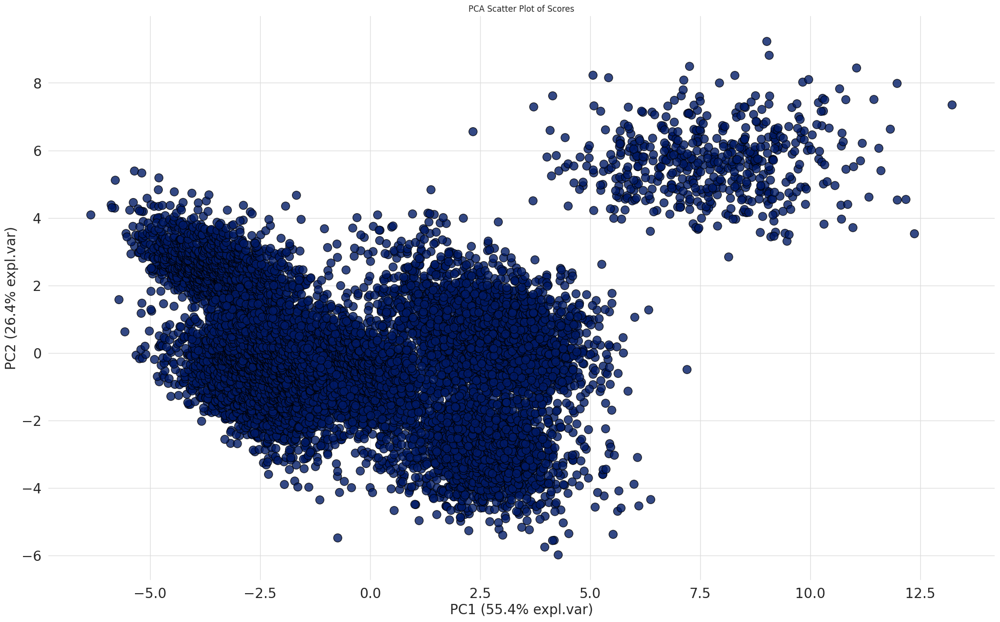

In [35]:
# Scatter Plot of PCA Scores
plt.figure(figsize=(8, 6))
model.scatter(label=True, legend=False)  # Visualizes the PCA projection with class labels
plt.title('PCA Scatter Plot of Scores')
plt.show()

In [36]:
# Eigenvectors (Loadings)
A = out['loadings'].T  # Transpose for better structure
print("Eigenvectors (Loadings):\n", A)

Eigenvectors (Loadings):
          PC1       PC2       PC3       PC4
1   0.282458  0.245882 -0.061447 -0.031546
2   0.310891  0.179303 -0.018853 -0.042468
3   0.325824  0.100757 -0.084692 -0.006793
4   0.236199  0.343461  0.007500 -0.061300
5   0.229298 -0.330844 -0.169058  0.053646
6   0.231526 -0.319434 -0.163042  0.118389
7   0.283200  0.244630 -0.053649 -0.030960
8   0.297484  0.222802 -0.049914 -0.032427
9  -0.059808  0.220619 -0.085258  0.948254
10 -0.143016  0.103322 -0.738670 -0.049546
11 -0.248165  0.214805 -0.163325  0.067482
12 -0.238378  0.328914  0.149701 -0.087156
13 -0.221319 -0.332549 -0.032623  0.072330
14 -0.314625  0.129419  0.120077 -0.046544
15 -0.238983  0.327522  0.149570 -0.095679
16 -0.198009  0.100061 -0.536903 -0.210120


In [37]:
#eigevalues
eigenvalues = out['explained_var']

In [38]:
eigenvalues

array([0.55466439, 0.81897412, 0.89903976, 0.95018056, 0.97757349,
       0.9890711 , 0.99604761, 0.99929843, 0.9998147 , 0.99990557,
       0.99997146, 0.99998983, 0.99999913, 0.99999975, 0.99999989,
       1.        ])

<ipython-input-39-2d65f95535e3>:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(x=A.PC1[i] + 0.02, y=A.PC2[i] + 0.02, s=variables[i],


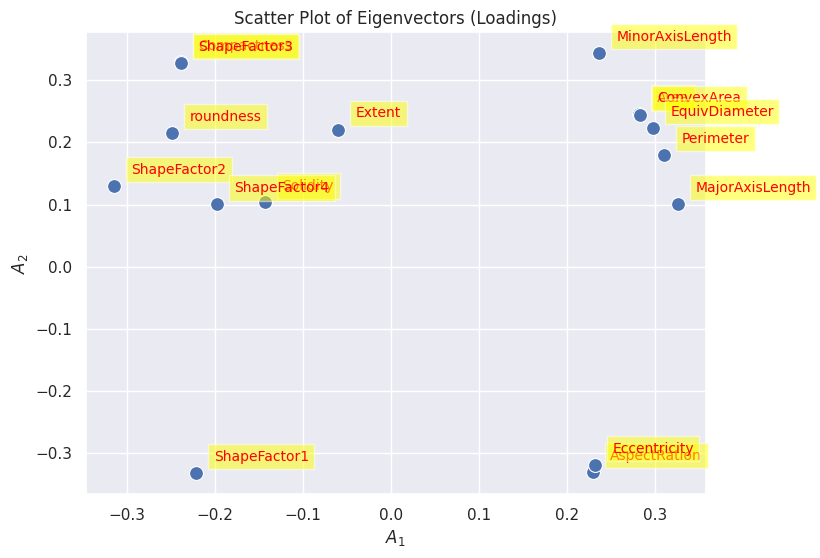

In [39]:
# Scatter Plot of Loadings
plt.figure(figsize=(8, 6))
sns.scatterplot(data=A, x="PC1", y="PC2", s=100)  # Scatter plot of loadings
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
plt.title('Scatter Plot of Eigenvectors (Loadings)')

# Annotate loadings with variable names
for i in range(A.shape[0]):
    plt.text(x=A.PC1[i] + 0.02, y=A.PC2[i] + 0.02, s=variables[i],
             fontdict=dict(color='red', size=10),
             bbox=dict(facecolor='yellow', alpha=0.5))
plt.grid(True)
plt.show()

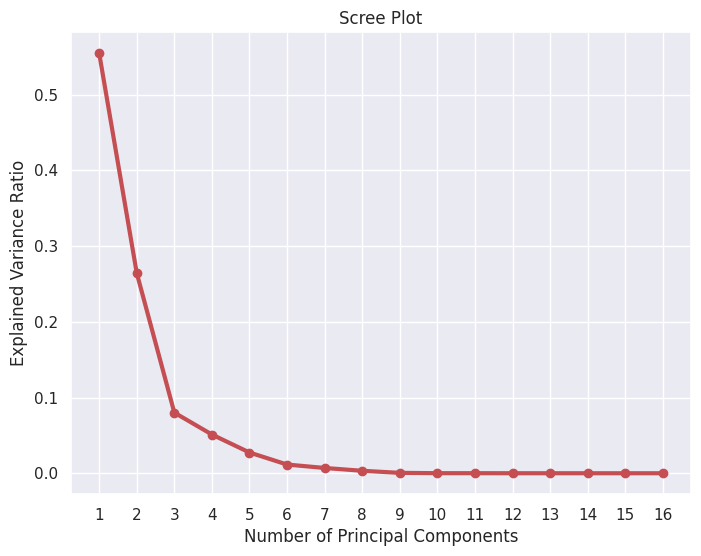

In [40]:
# Scree Plot (Explained Variance Ratio)
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1

plt.figure(figsize=(8, 6))
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [str(i) for i in x], rotation=0)
plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Scree Plot')
plt.grid(True)
plt.show()

<Figure size 800x600 with 0 Axes>

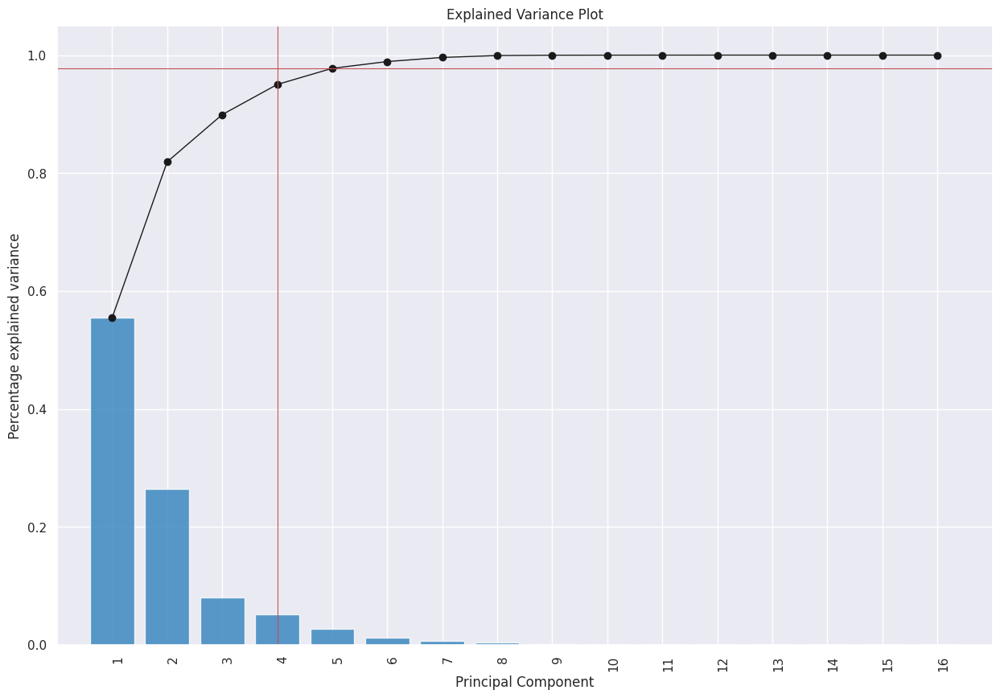

In [41]:
# Explained Variance Plot
plt.figure(figsize=(8, 6))
model.plot()  # Visualizes cumulative and individual variance
plt.title('Explained Variance Plot')
plt.show()

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


<Figure size 1000x800 with 0 Axes>

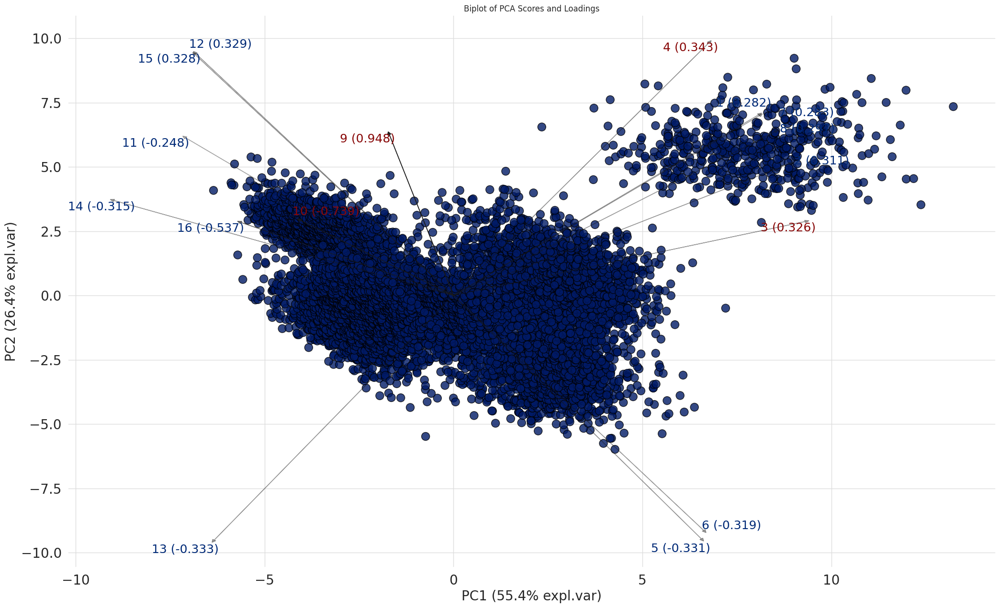

In [42]:
# Biplot: Combine PCA scores and loadings
plt.figure(figsize=(10, 8))
model.biplot(label=False, legend=False, color_arrow='k')
plt.title('Biplot of PCA Scores and Loadings')
plt.show()

In [43]:
cov_matrix = np.cov(X_scaled, rowvar=False)

# Step 3: Perform eigen decomposition
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Step 4: Sort eigenvalues in descending order
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

In [44]:
eigenvalues

array([8.87528224e+00, 4.22926643e+00, 1.28114440e+00, 8.18312967e-01,
       4.38319068e-01, 1.83975267e-01, 1.11632319e-01, 5.20170215e-02,
       8.26086874e-03, 1.45399677e-03, 1.05426615e-03, 2.94004480e-04,
       1.48805562e-04, 1.00110039e-05, 2.14627105e-06, 1.78492305e-06])

In [45]:
eigenvectors

array([[ 2.82457959e-01,  2.45882017e-01, -6.14466784e-02,
        -3.15461943e-02, -9.13256239e-02, -3.66390031e-01,
         1.25044850e-01,  7.17479146e-02,  3.50665700e-02,
        -3.90419508e-01, -1.77686508e-01,  5.44841917e-02,
         4.62948192e-02,  6.55727932e-01,  1.33190218e-01,
         2.31436022e-01],
       [ 3.10891123e-01,  1.79302922e-01, -1.88525950e-02,
        -4.24678978e-02,  8.18198658e-02, -1.02508240e-02,
         8.15297016e-02,  3.17295057e-02, -1.57501165e-01,
         3.44383058e-01,  1.99453658e-01, -7.50549996e-01,
         3.17920227e-01,  8.13901184e-02,  1.26584592e-02,
         1.46143882e-02],
       [ 3.25823976e-01,  1.00756515e-01, -8.46919062e-02,
        -6.79308171e-03, -4.42163130e-02, -1.49091961e-02,
         1.18162545e-01, -2.00947005e-01, -3.52366424e-01,
         1.01996462e-01,  1.73639719e-01,  2.73550308e-02,
        -6.85301954e-01, -1.86251286e-01,  1.74431465e-01,
         3.46019470e-01],
       [ 2.36199383e-01,  3.43460651e

In [46]:
from pca import pca
modela = pca(n_components=4)  # By default, keeps all principal components
outt = modela.fit_transform(X_scaled)

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed on the [16] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[4]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


In [47]:
out['loadings']

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
PC1,0.282458,0.310891,0.325824,0.236199,0.229298,0.231526,0.283200,0.297484,-0.059808,-0.143016,-0.248165,-0.238378,-0.221319,-0.314625,-0.238983,-0.198009
PC2,0.245882,0.179303,0.100757,0.343461,-0.330844,-0.319434,0.244630,0.222802,0.220619,0.103322,0.214805,0.328914,-0.332549,0.129419,0.327522,0.100061
PC3,-0.061447,-0.018853,-0.084692,0.007500,-0.169058,-0.163042,-0.053649,-0.049914,-0.085258,-0.738670,-0.163325,0.149701,-0.032623,0.120077,0.149570,-0.536903
PC4,-0.031546,-0.042468,-0.006793,-0.061300,0.053646,0.118389,-0.030960,-0.032427,0.948254,-0.049546,0.067482,-0.087156,0.072330,-0.046544,-0.095679,-0.210120


In [48]:
outt['explained_var']

array([0.55466439, 0.81897412, 0.89903976, 0.95018056])

In [49]:
outt

{'loadings':             1         2         3         4         5         6         7  \
 PC1  0.282458  0.310891  0.325824  0.236199  0.229298  0.231526  0.283200   
 PC2  0.245882  0.179303  0.100757  0.343461 -0.330844 -0.319434  0.244630   
 PC3 -0.061447 -0.018853 -0.084692  0.007500 -0.169058 -0.163042 -0.053649   
 PC4 -0.031546 -0.042468 -0.006793 -0.061300  0.053646  0.118389 -0.030960   
 
             8         9        10        11        12        13        14  \
 PC1  0.297484 -0.059808 -0.143016 -0.248165 -0.238378 -0.221319 -0.314625   
 PC2  0.222802  0.220619  0.103322  0.214805  0.328914 -0.332549  0.129419   
 PC3 -0.049914 -0.085258 -0.738670 -0.163325  0.149701 -0.032623  0.120077   
 PC4 -0.032427  0.948254 -0.049546  0.067482 -0.087156  0.072330 -0.046544   
 
            15        16  
 PC1 -0.238983 -0.198009  
 PC2  0.327522  0.100061  
 PC3  0.149570 -0.536903  
 PC4 -0.095679 -0.210120  ,
 'PC':             PC1       PC2       PC3       PC4
 0     -4.98156

In [50]:
loadings = out['loadings']

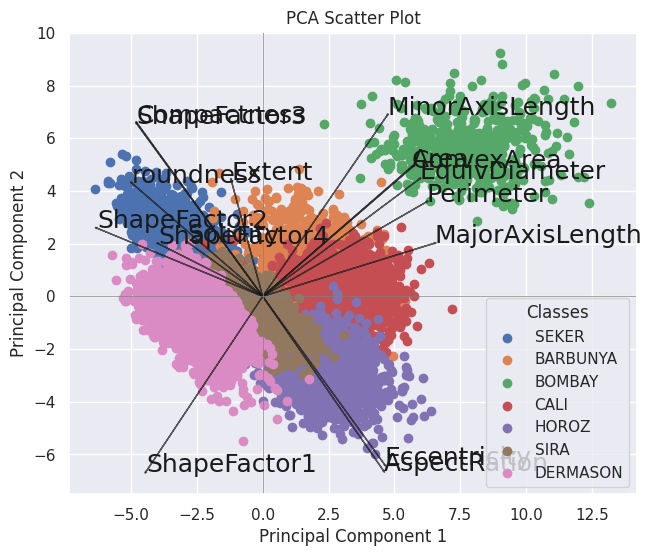

In [51]:
# Step 1: Create biplot
plt.figure(figsize=(10, 6))

# Plot the PCA scores (dots), assuming 'outt' contains PCA scores for the first 2 components
#plt.scatter(out[:, 0], out[:, 1])

for label, color_idx in class_colors.items():
    plt.scatter(
        X_pca_2d[y_encoded == color_idx, 0],
        X_pca_2d[y_encoded == color_idx, 1],
        label=label
    )
plt.legend(title="Classes")

# Step 2: Plot the loadings (arrows) with lengthened arrows
for i in range(len(variables)):
    # Increase the scaling factor (adjust this factor to lengthen the arrows)
    plt.arrow(0, 0, loadings.iloc[0, i] * 20, loadings.iloc[1, i] * 20, color='k', alpha=0.7, head_width=0.05)

    # Add feature names at the tip of the arrows
    plt.text(loadings.iloc[0, i] * 20, loadings.iloc[1, i] * 20, variables[i], color='k')

# Adjust the plot settings and display
plt.axhline(0, color='grey',linewidth=0.5)
plt.axvline(0, color='grey',linewidth=0.5)
plt.gca().set_aspect('equal', adjustable='box')
plt.title('PCA Scatter Plot')

plt.grid(True)
plt.legend(title="Classes")
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Classification without PCA

In [52]:
# Split the data into training and unseen datasets
data_seen = data.sample(frac=0.9, random_state=786)  # 90% for training and validation
data_unseen = data.drop(data_seen.index)  # Remaining 10% for unseen data

In [53]:
# Reset indices for clean splits
data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

# Check the shape of the splits
print('Data for Modeling: ' + str(data.shape))
print('Unseen Data for Predictions: ' + str(data_unseen.shape))

Data for Modeling: (13611, 17)
Unseen Data for Predictions: (1361, 17)


In [54]:
# PyCaret Setup: Initialize the classification environment
from pycaret.classification import *
clf = setup(data=data_seen,
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123)  # For reproducibility

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(12250, 17)"
5,Transformed data shape,"(12250, 17)"
6,Transformed train set shape,"(8575, 17)"
7,Transformed test set shape,"(3675, 17)"
8,Numeric features,16
9,Preprocess,True


In [55]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9269,0.0000,0.9269,0.9273,0.9269,0.9116,0.9117,32.4080
lightgbm,Light Gradient Boosting Machine,0.9254,0.9938,0.9254,0.9259,0.9254,0.9098,0.9098,4.6860
xgboost,Extreme Gradient Boosting,0.9244,0.9937,0.9244,0.9250,0.9245,0.9086,0.9087,1.3450
rf,Random Forest Classifier,0.9226,0.9921,0.9226,0.9229,0.9225,0.9064,0.9065,2.7280
et,Extra Trees Classifier,0.9172,0.9918,0.9172,0.9178,0.9172,0.8999,0.9000,0.7270
qda,Quadratic Discriminant Analysis,0.9118,0.0000,0.9118,0.9156,0.9122,0.8936,0.8944,0.0530
lda,Linear Discriminant Analysis,0.9038,0.0000,0.9038,0.9142,0.9054,0.8837,0.8855,0.0960
dt,Decision Tree Classifier,0.8926,0.9341,0.8926,0.8933,0.8927,0.8703,0.8704,0.1840
lr,Logistic Regression,0.8652,0.0000,0.8652,0.8668,0.8652,0.8369,0.8372,2.2380
ridge,Ridge Classifier,0.8564,0.0000,0.8564,0.8681,0.8502,0.8251,0.8318,0.0480


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

# main

In [56]:
# PyCaret Setup: Initialize the classification environment
from pycaret.classification import *
clf = setup(data=data,
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123)  # For reproducibility

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(13611, 17)"
5,Transformed data shape,"(13611, 17)"
6,Transformed train set shape,"(9527, 17)"
7,Transformed test set shape,"(4084, 17)"
8,Numeric features,16
9,Preprocess,True


In [57]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9277,0.9937,0.9277,0.9282,0.9277,0.9125,0.9126,5.0470
gbc,Gradient Boosting Classifier,0.9261,0.0000,0.9261,0.9266,0.9260,0.9106,0.9107,33.1520
xgboost,Extreme Gradient Boosting,0.9246,0.9936,0.9246,0.9251,0.9246,0.9088,0.9089,1.4190
rf,Random Forest Classifier,0.9229,0.9923,0.9229,0.9232,0.9228,0.9067,0.9068,2.9780
et,Extra Trees Classifier,0.9193,0.9923,0.9193,0.9199,0.9193,0.9023,0.9024,0.9690
qda,Quadratic Discriminant Analysis,0.9151,0.0000,0.9151,0.9183,0.9154,0.8975,0.8981,0.0550
lda,Linear Discriminant Analysis,0.9071,0.0000,0.9071,0.9168,0.9086,0.8877,0.8894,0.0540
dt,Decision Tree Classifier,0.8941,0.9349,0.8941,0.8947,0.8941,0.8720,0.8721,0.1970
ridge,Ridge Classifier,0.8601,0.0000,0.8601,0.8712,0.8537,0.8294,0.8360,0.0520
lr,Logistic Regression,0.8567,0.0000,0.8567,0.8578,0.8565,0.8265,0.8268,1.9350


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [58]:
best_model

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [59]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8531,0.0000,0.8531,0.8542,0.8531,0.8224,0.8226
1,0.8531,0.0000,0.8531,0.8544,0.8534,0.8224,0.8226
2,0.8374,0.0000,0.8374,0.8357,0.8359,0.8028,0.8031
3,0.8678,0.0000,0.8678,0.8682,0.8669,0.8398,0.8401
4,0.8499,0.0000,0.8499,0.8514,0.8504,0.8183,0.8184
5,0.8583,0.0000,0.8583,0.8632,0.8590,0.8284,0.8291
6,0.8447,0.0000,0.8447,0.8459,0.8451,0.8124,0.8125
7,0.8624,0.0000,0.8624,0.8646,0.8620,0.8329,0.8335
8,0.8782,0.0000,0.8782,0.8786,0.8781,0.8526,0.8527


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [60]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8646,0.0000,0.8646,0.8664,0.8648,0.8364,0.8367
1,0.8877,0.0000,0.8877,0.8887,0.8879,0.8642,0.8644
2,0.8730,0.0000,0.8730,0.8746,0.8729,0.8460,0.8464
3,0.8972,0.0000,0.8972,0.8985,0.8972,0.8756,0.8758
4,0.8867,0.0000,0.8867,0.8868,0.8867,0.8630,0.8630
5,0.8510,0.0000,0.8510,0.8547,0.8518,0.8197,0.8201
6,0.8709,0.0000,0.8709,0.8745,0.8716,0.8439,0.8444
7,0.8992,0.0000,0.8992,0.9002,0.8993,0.8778,0.8779
8,0.8676,0.0000,0.8676,0.8680,0.8671,0.8398,0.8399


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [61]:
tuned_lr

LogisticRegression(C=6.718000000000001, class_weight={}, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [62]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Classification + PCA

In [63]:
clf = setup(data=data,
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123,  # For reproducibility
            normalize=True,  # Standardize numerical features
            pca=True,  # Enable PCA
            pca_components=4)  # Reduce to 4 principal components

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(13611, 17)"
5,Transformed data shape,"(13611, 5)"
6,Transformed train set shape,"(9527, 5)"
7,Transformed test set shape,"(4084, 5)"
8,Numeric features,16
9,Preprocess,True


In [64]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8911,0.0000,0.8911,0.8910,0.8906,0.8683,0.8684,9.3260
lr,Logistic Regression,0.8895,0.0000,0.8895,0.8898,0.8890,0.8663,0.8665,0.1660
qda,Quadratic Discriminant Analysis,0.8885,0.0000,0.8885,0.8892,0.8880,0.8652,0.8655,0.1100
et,Extra Trees Classifier,0.8873,0.9884,0.8873,0.8871,0.8866,0.8636,0.8638,0.8210
rf,Random Forest Classifier,0.8871,0.9878,0.8871,0.8869,0.8864,0.8633,0.8635,1.7480
lightgbm,Light Gradient Boosting Machine,0.8836,0.9885,0.8836,0.8836,0.8831,0.8591,0.8593,2.6520
lda,Linear Discriminant Analysis,0.8822,0.0000,0.8822,0.8844,0.8814,0.8575,0.8581,0.0710
xgboost,Extreme Gradient Boosting,0.8816,0.9882,0.8816,0.8813,0.8811,0.8567,0.8569,0.6340
knn,K Neighbors Classifier,0.8814,0.9735,0.8814,0.8815,0.8810,0.8565,0.8566,0.1310
nb,Naive Bayes,0.8661,0.9822,0.8661,0.8661,0.8645,0.8379,0.8383,0.0730


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [65]:
best_model_pca

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [66]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8898,0.0000,0.8898,0.8896,0.8887,0.8665,0.8668
1,0.9014,0.0000,0.9014,0.9015,0.9008,0.8806,0.8807
2,0.9014,0.0000,0.9014,0.9010,0.9006,0.8805,0.8807
3,0.9024,0.0000,0.9024,0.9018,0.9013,0.8819,0.8821
4,0.9035,0.0000,0.9035,0.9025,0.9020,0.8831,0.8834
5,0.8783,0.0000,0.8783,0.8792,0.8774,0.8526,0.8530
6,0.8825,0.0000,0.8825,0.8828,0.8823,0.8579,0.8580
7,0.8866,0.0000,0.8866,0.8863,0.8858,0.8624,0.8627
8,0.8845,0.0000,0.8845,0.8840,0.8838,0.8602,0.8603


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [67]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Random forest classifier

In [68]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8846,0.9885,0.8846,0.8837,0.8839,0.8602,0.8603
1,0.8909,0.9887,0.8909,0.8904,0.8902,0.8679,0.8680
2,0.8919,0.9893,0.8919,0.8916,0.8915,0.8691,0.8693
3,0.9014,0.9896,0.9014,0.9021,0.9006,0.8807,0.8810
4,0.8898,0.9878,0.8898,0.8889,0.8890,0.8667,0.8669
5,0.8825,0.9833,0.8825,0.8827,0.8816,0.8577,0.8580
6,0.8877,0.9869,0.8877,0.8880,0.8877,0.8642,0.8643
7,0.8824,0.9876,0.8824,0.8825,0.8817,0.8573,0.8576
8,0.8824,0.9880,0.8824,0.8816,0.8814,0.8578,0.8579


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [69]:
rf_tuned = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8688,0.9830,0.8688,0.8680,0.8680,0.8415,0.8416
1,0.8772,0.9865,0.8772,0.8780,0.8769,0.8517,0.8519
2,0.8678,0.9836,0.8678,0.8677,0.8672,0.8403,0.8405
3,0.8657,0.9841,0.8657,0.8661,0.8654,0.8378,0.8380
4,0.8709,0.9842,0.8709,0.8697,0.8692,0.8441,0.8445
5,0.8583,0.9783,0.8583,0.8589,0.8571,0.8289,0.8294
6,0.8458,0.9799,0.8458,0.8481,0.8459,0.8138,0.8142
7,0.8782,0.9840,0.8782,0.8775,0.8771,0.8524,0.8527
8,0.8803,0.9824,0.8803,0.8819,0.8798,0.8553,0.8557


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [70]:
evaluate_model(rf_tuned)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

extra Tree Classifier

In [72]:
et = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8909,0.9882,0.8909,0.8899,0.8901,0.8679,0.8680
1,0.8961,0.9890,0.8961,0.8960,0.8956,0.8742,0.8744
2,0.8919,0.9906,0.8919,0.8920,0.8916,0.8691,0.8693
3,0.8982,0.9902,0.8982,0.8980,0.8978,0.8770,0.8771
4,0.8783,0.9893,0.8783,0.8769,0.8769,0.8527,0.8530
5,0.8783,0.9843,0.8783,0.8793,0.8772,0.8526,0.8531
6,0.8814,0.9879,0.8814,0.8821,0.8814,0.8567,0.8568
7,0.8918,0.9882,0.8918,0.8919,0.8912,0.8688,0.8691
8,0.8845,0.9878,0.8845,0.8833,0.8835,0.8603,0.8604


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [73]:
et_tuned = tune_model(et)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8835,0.9853,0.8835,0.8840,0.8826,0.8591,0.8594
1,0.8846,0.9882,0.8846,0.8884,0.8835,0.8604,0.8613
2,0.8846,0.9862,0.8846,0.8850,0.8834,0.8603,0.8606
3,0.8814,0.9876,0.8814,0.8809,0.8799,0.8566,0.8569
4,0.8762,0.9860,0.8762,0.8750,0.8747,0.8504,0.8507
5,0.8667,0.9820,0.8667,0.8685,0.8655,0.8388,0.8394
6,0.8657,0.9840,0.8657,0.8667,0.8651,0.8376,0.8379
7,0.8750,0.9861,0.8750,0.8742,0.8735,0.8486,0.8488
8,0.8813,0.9844,0.8813,0.8812,0.8799,0.8564,0.8568


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [74]:
evaluate_model(et_tuned)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Quadrantic Discrimainat Analysis

In [75]:
qda = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8867,0.0000,0.8867,0.8865,0.8862,0.8630,0.8632
1,0.8919,0.0000,0.8919,0.8921,0.8913,0.8693,0.8695
2,0.8951,0.0000,0.8951,0.8949,0.8946,0.8730,0.8731
3,0.8982,0.0000,0.8982,0.8988,0.8976,0.8771,0.8774
4,0.8961,0.0000,0.8961,0.8959,0.8956,0.8745,0.8746
5,0.8751,0.0000,0.8751,0.8773,0.8743,0.8490,0.8496
6,0.8835,0.0000,0.8835,0.8856,0.8839,0.8594,0.8597
7,0.8960,0.0000,0.8960,0.8960,0.8955,0.8740,0.8742
8,0.8824,0.0000,0.8824,0.8825,0.8816,0.8579,0.8581


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [76]:
qda_tuned = tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8835,0.0000,0.8835,0.8833,0.8824,0.8592,0.8595
1,0.8951,0.0000,0.8951,0.8964,0.8943,0.8731,0.8735
2,0.8951,0.0000,0.8951,0.8955,0.8942,0.8730,0.8733
3,0.8940,0.0000,0.8940,0.8944,0.8931,0.8720,0.8723
4,0.8898,0.0000,0.8898,0.8892,0.8889,0.8668,0.8670
5,0.8846,0.0000,0.8846,0.8878,0.8833,0.8603,0.8612
6,0.8762,0.0000,0.8762,0.8781,0.8762,0.8505,0.8509
7,0.8971,0.0000,0.8971,0.8971,0.8962,0.8752,0.8755
8,0.8803,0.0000,0.8803,0.8804,0.8785,0.8552,0.8557


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [77]:
evaluate_model(qda_tuned)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Linear discrimant Analysis

In [78]:
lda = create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8762,0.0000,0.8762,0.8792,0.8758,0.8502,0.8509
1,0.8940,0.0000,0.8940,0.8972,0.8937,0.8717,0.8723
2,0.8909,0.0000,0.8909,0.8929,0.8895,0.8678,0.8685
3,0.8951,0.0000,0.8951,0.8968,0.8941,0.8731,0.8738
4,0.8898,0.0000,0.8898,0.8893,0.8886,0.8667,0.8670
5,0.8699,0.0000,0.8699,0.8729,0.8682,0.8425,0.8435
6,0.8720,0.0000,0.8720,0.8772,0.8725,0.8452,0.8461
7,0.8803,0.0000,0.8803,0.8812,0.8799,0.8550,0.8553
8,0.8782,0.0000,0.8782,0.8788,0.8761,0.8526,0.8532


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [79]:
lda_tuned = tune_model(lda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8762,0.0000,0.8762,0.8792,0.8758,0.8502,0.8509
1,0.8951,0.0000,0.8951,0.8982,0.8947,0.8730,0.8736
2,0.8919,0.0000,0.8919,0.8940,0.8905,0.8691,0.8698
3,0.8940,0.0000,0.8940,0.8956,0.8931,0.8719,0.8725
4,0.8909,0.0000,0.8909,0.8903,0.8896,0.8680,0.8682
5,0.8699,0.0000,0.8699,0.8729,0.8682,0.8425,0.8435
6,0.8720,0.0000,0.8720,0.8772,0.8725,0.8452,0.8461
7,0.8792,0.0000,0.8792,0.8803,0.8789,0.8537,0.8540
8,0.8782,0.0000,0.8782,0.8788,0.8761,0.8526,0.8532


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [80]:
evaluate_model(lda_tuned)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Gradianet boosting classifier

In [81]:
gbc = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8877,0.0000,0.8877,0.8870,0.8867,0.8641,0.8643
1,0.9003,0.0000,0.9003,0.9002,0.8997,0.8793,0.8795
2,0.8982,0.0000,0.8982,0.8980,0.8978,0.8768,0.8769
3,0.9045,0.0000,0.9045,0.9046,0.9040,0.8845,0.8847
4,0.9014,0.0000,0.9014,0.9000,0.9001,0.8807,0.8809
5,0.8825,0.0000,0.8825,0.8829,0.8817,0.8577,0.8580
6,0.8888,0.0000,0.8888,0.8889,0.8887,0.8655,0.8655
7,0.8845,0.0000,0.8845,0.8839,0.8838,0.8599,0.8601
8,0.8908,0.0000,0.8908,0.8902,0.8902,0.8678,0.8679


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [82]:
gbc_tuned = tune_model(gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8898,0.0000,0.8898,0.8896,0.8887,0.8665,0.8668
1,0.9014,0.0000,0.9014,0.9015,0.9008,0.8806,0.8807
2,0.9014,0.0000,0.9014,0.9010,0.9006,0.8805,0.8807
3,0.9024,0.0000,0.9024,0.9018,0.9013,0.8819,0.8821
4,0.9035,0.0000,0.9035,0.9025,0.9020,0.8831,0.8834
5,0.8783,0.0000,0.8783,0.8792,0.8774,0.8526,0.8530
6,0.8825,0.0000,0.8825,0.8828,0.8823,0.8579,0.8580
7,0.8866,0.0000,0.8866,0.8863,0.8858,0.8624,0.8627
8,0.8845,0.0000,0.8845,0.8840,0.8838,0.8602,0.8603


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [83]:
evaluate_model(gbc_tuned)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Setting functions

In [84]:
class_mapping = {
    0: 'BARBUNYA',
    1: 'BOMBAY',
    2: 'CALI',
    3: 'DERMASON',
    4: 'HOROZ',
    5: 'SEKER',
    6: 'SIRA'
}

results = []
sets = ['TP', 'FP', 'FN', 'TN']

In [85]:
def convert_to_confusion_matrix(cm):
    n_classes = cm.shape[0]
    for i in range(n_classes):
      TP = cm[i, i]
      FP = cm[:, i].sum() - TP
      FN = cm[i, :].sum() - TP
      TN = cm.sum() - (TP + FP + FN)
      results.append({"Class": class_mapping[i], "TP": TP, "FP": FP, "FN": FN, "TN": TN})

    metric_sum = {}

    for t in sets:
      value = 0
      total = 0
      for i in range(0, len(results)):
          value = results[i][t]
          total = total + value
          h = t
      metric_sum[h] = total
    return metric_sum


In [87]:
def plot_my_confusion_matrix(cm, modella):
      # Calculate the sum of each metric
    metric_sums = convert_to_confusion_matrix(cm)
    #modella = str(modella).replace("_tuned", "")
   #print(modella)

    if modella == 'rf':
        Label = 'Random Forest Classifier'
    elif modella == 'qda':
        Label = 'Quadratic Discriminant Analysis'
    elif modella == 'lda':
        Label = 'Linear Discriminant Analysis'
    elif modella == 'gbc':
        Label = 'Gradient Boosting Classifier'
    elif modella == 'xgboost':
        Label = 'Extreme Gradient Boosting'
    elif modella == 'lightgbm':
        Label = 'Light Gradient Boosting Machine'
    elif modella == 'et':
        Label = 'Extra Trees Classifier'
    elif modella == 'dt':
        Label = 'Decision Tree Classifier'
    elif modella == 'lr':
        Label = 'Logistic Regression'
    elif modella == 'ridge':
        Label = 'Ridge Classifier'
    elif modella == 'nb':
        Label = 'Naive Bayes'
    elif modella == 'knn':
        Label = 'K Neighbors Classifier'
    elif modella == 'ada':
        Label = 'Ada Boost Classifier'
    elif modella == 'svm':
        Label = 'SVM - Linear Kernel'
    elif modella == 'dummy':
        Label = 'Dummy Classifier'
    else:
        Label = 'Unknown Model'

    # Data for the confusion plot
    labels = list(metric_sums.keys())
    values = list(metric_sums.values())

    # Plotting the bar chart
    plt.figure(figsize=(8, 5))
    bars = plt.bar(labels, values, color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])

    # Adding value annotations
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 50, int(yval), ha='center', va='bottom')

    # Adding titles and labels
    plt.title('Sum of Confusion Metrics Across All Classes', fontsize=14)
    plt.ylabel('Counts', fontsize=12)
    plt.xlabel('Metrics', fontsize=12)
    plt.ylim(0, max(values) + 500)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # Sum up True Positives, False Positives, False Negatives, and True Negatives
    TP = np.trace(cm)  # Sum of diagonal elements (True Positives)
    FP = cm.sum(axis=0) - np.diag(cm)  # Column-wise sum minus diagonal elements
    FN = cm.sum(axis=1) - np.diag(cm)  # Row-wise sum minus diagonal elements
    TN = cm.sum() - (TP + FP.sum() + FN.sum())  # Total sum minus all other elements

    # Simplified 2x2 confusion matrix
    simplified_cm = np.array([[TP, FN.sum()], [FP.sum(), TN]])

    # Plotting the simplified confusion matrix
    plt.figure(figsize=(5, 5))
    plt.imshow(simplified_cm, cmap='Blues', interpolation='nearest')
    plt.title('{} Confusion Matrix (2x2)'.format(Label), fontsize=14)
    plt.colorbar()

    # Add annotations
    classes = ['Positive', 'Negative']
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, ['Actual ' + label for label in classes], rotation=45, fontsize=10)
    plt.yticks(tick_marks, ['Predicted ' + label for label in classes], fontsize=10)

    for i in range(2):
        for j in range(2):
            plt.text(j, i, f'{simplified_cm[i, j]}', ha='center', va='center', color='black', fontsize=12)

    plt.ylabel('Predicted Label', fontsize=12)
    plt.xlabel('True Label', fontsize=12)
    plt.tight_layout()
    plt.show()

    simplified_cm

In [99]:
from sklearn.metrics import confusion_matrix
def get_cm(modell):
    predictions = predict_model(modell)
    y_true = predictions['Class']  # Actual values
    y_pred = predictions['prediction_label']   # Predicted values

    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    return cm

    # Display the confusion matrix


In [100]:
def perform_cm(modell, abv):
    cm = get_cm(modell)
    plot_my_confusion_matrix(cm, abv)



get confusion matrix of all models


In [102]:
# Get predictions for the test set
#perform_cm(tuned_best_model_pca)



,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.8839,0.9866,0.8839,0.8838,0.8838,0.8595,0.8596


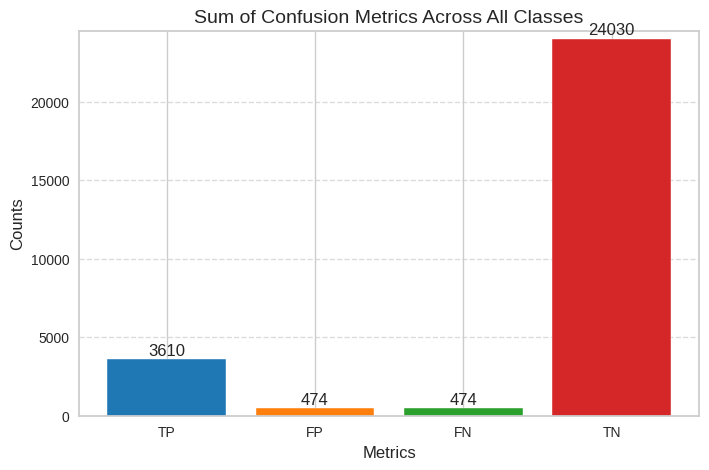

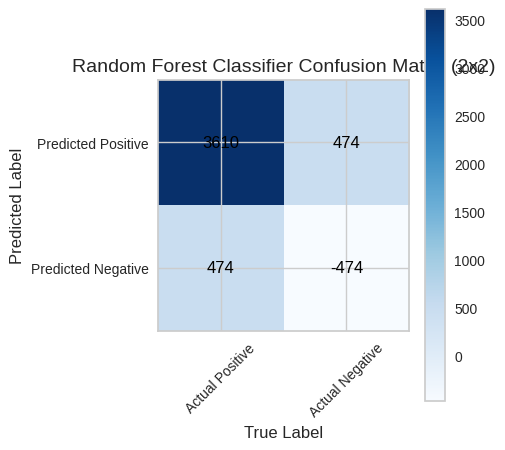

In [101]:
perform_cm(rf_tuned, 'rf')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Quadratic Discriminant Analysis,0.8839,0.9876,0.8839,0.8842,0.8836,0.8597,0.8599


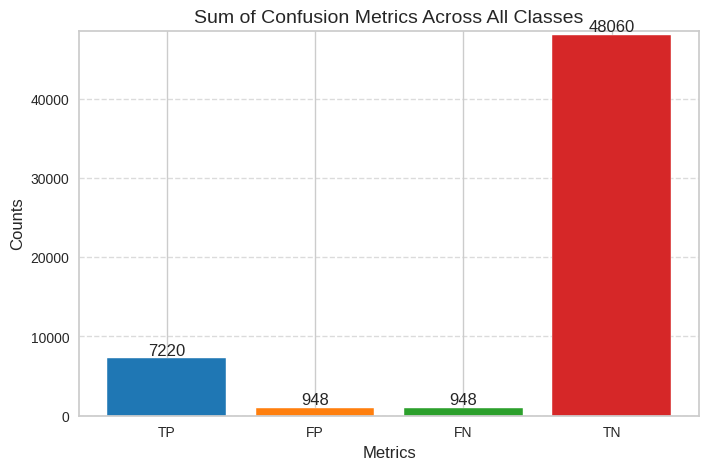

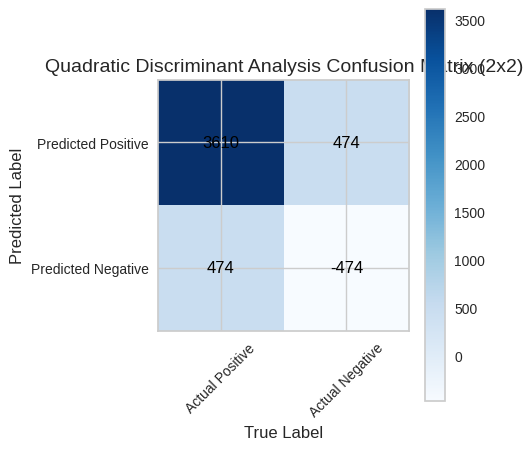

In [103]:
perform_cm(qda_tuned, 'qda')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Linear Discriminant Analysis,0.8744,0.9871,0.8744,0.8764,0.8742,0.8481,0.8485


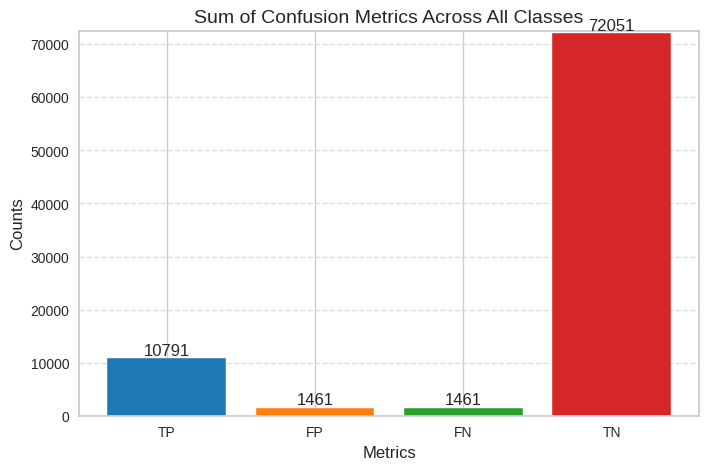

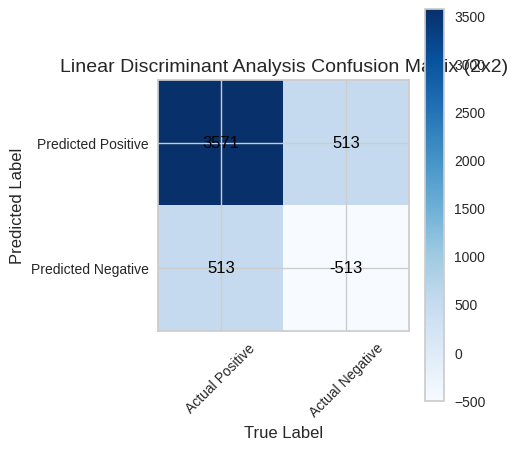

In [104]:
perform_cm(lda_tuned, 'lda')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.8913,0.9879,0.8913,0.8908,0.8908,0.8684,0.8685


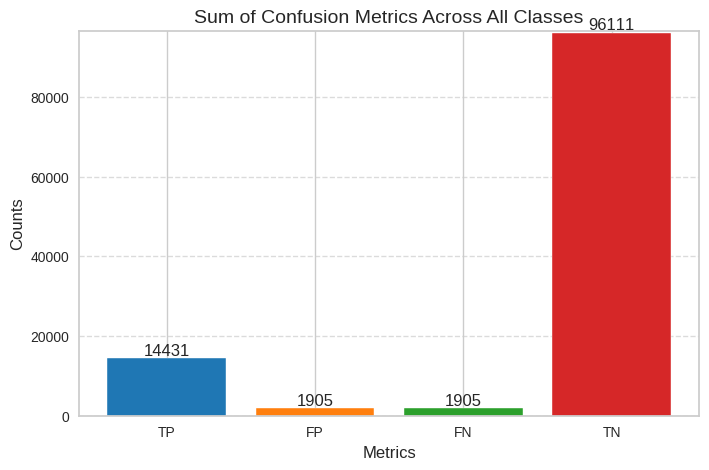

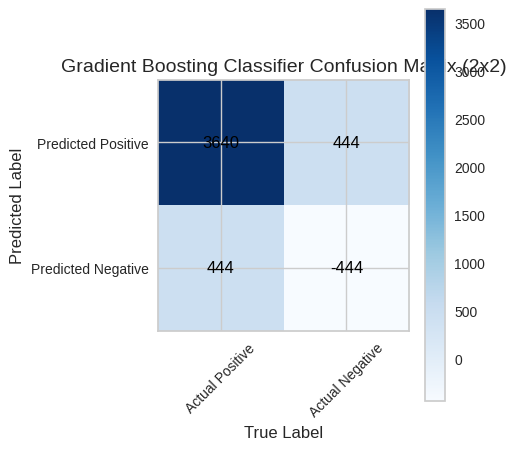

In [105]:
perform_cm(gbc_tuned, 'gbc')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.8827,0.9867,0.8827,0.8824,0.8825,0.8581,0.8581


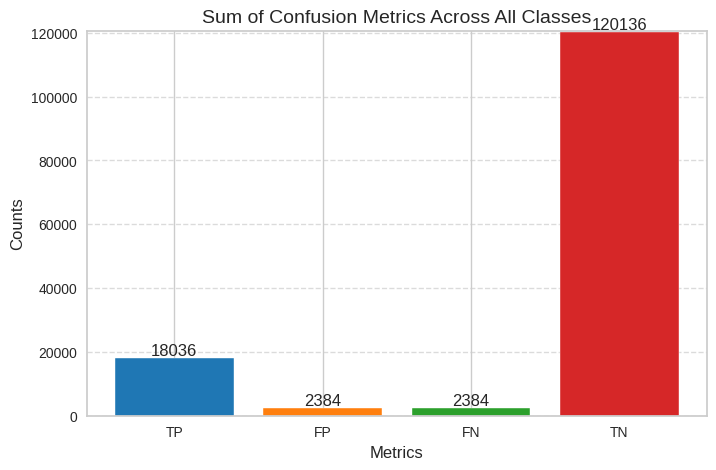

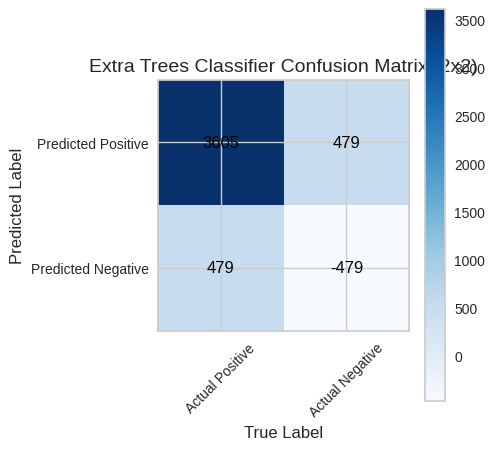

In [106]:
perform_cm(et_tuned, 'et')

In [107]:
predictions = predict_model(rf_tuned)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.8839,0.9866,0.8839,0.8838,0.8838,0.8595,0.8596


In [108]:

"""
# Import confusion_matrix from sklearn and calculate it
from sklearn.metrics import confusion_matrix
y_true = predictions['Class']  # Actual values
y_pred = predictions['prediction_label']   # Predicted values

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
print("Confusion Matrix:")
print(cm)"""


'\n# Import confusion_matrix from sklearn and calculate it\nfrom sklearn.metrics import confusion_matrix\ny_true = predictions[\'Class\']  # Actual values\ny_pred = predictions[\'prediction_label\']   # Predicted values\n\n# Generate confusion matrix\ncm = confusion_matrix(y_true, y_pred)\n\n# Display the confusion matrix\nprint("Confusion Matrix:")\nprint(cm)'

In [109]:
"""from sklearn.metrics import multilabel_confusion_matrix
mcm = multilabel_confusion_matrix(y_true, y_pred)

# Initialize the counters for total TP, FP, TN, FN
total_tp = total_fp = total_tn = total_fn = 0

# Loop through each label's confusion matrix (2x2)
for cm in mcm:
    tn, fp, fn, tp = cm.ravel()  # ravel() to unpack the matrix into individual values
    total_tp += tp
    total_fp += fp
    total_tn += tn
    total_fn += fn

# Create the total confusion matrix summary
summary_conf_matrix = np.array([[total_tn, total_fp], [total_fn, total_tp]])

print("Summary Confusion Matrix (Total across all labels):")
print(summary_conf_matrix)
"""

'from sklearn.metrics import multilabel_confusion_matrix\nmcm = multilabel_confusion_matrix(y_true, y_pred)\n\n# Initialize the counters for total TP, FP, TN, FN\ntotal_tp = total_fp = total_tn = total_fn = 0\n\n# Loop through each label\'s confusion matrix (2x2)\nfor cm in mcm:\n    tn, fp, fn, tp = cm.ravel()  # ravel() to unpack the matrix into individual values\n    total_tp += tp\n    total_fp += fp\n    total_tn += tn\n    total_fn += fn\n\n# Create the total confusion matrix summary\nsummary_conf_matrix = np.array([[total_tn, total_fp], [total_fn, total_tp]])\n\nprint("Summary Confusion Matrix (Total across all labels):")\nprint(summary_conf_matrix)\n'

In [111]:
#mcm

In [112]:
#type(cm)

In [113]:
#plot_model(rf_tuned, plot='confusion_matrix', )

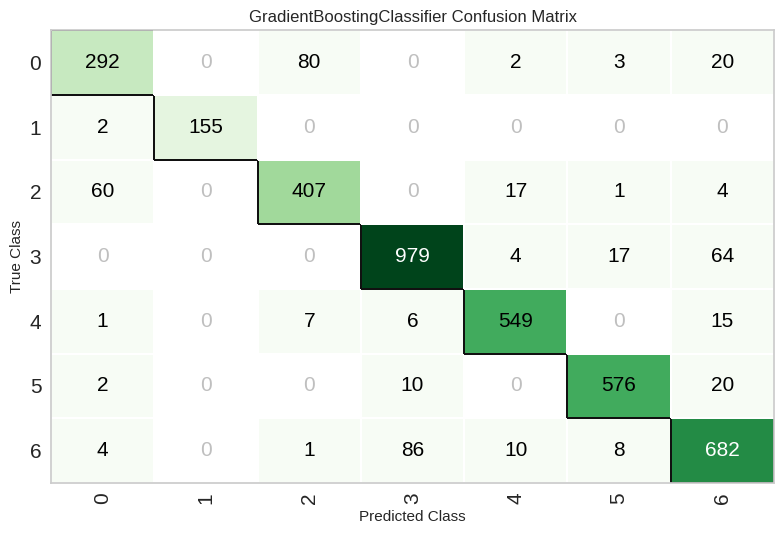

In [114]:
plot_model(gbc_tuned, plot='confusion_matrix')

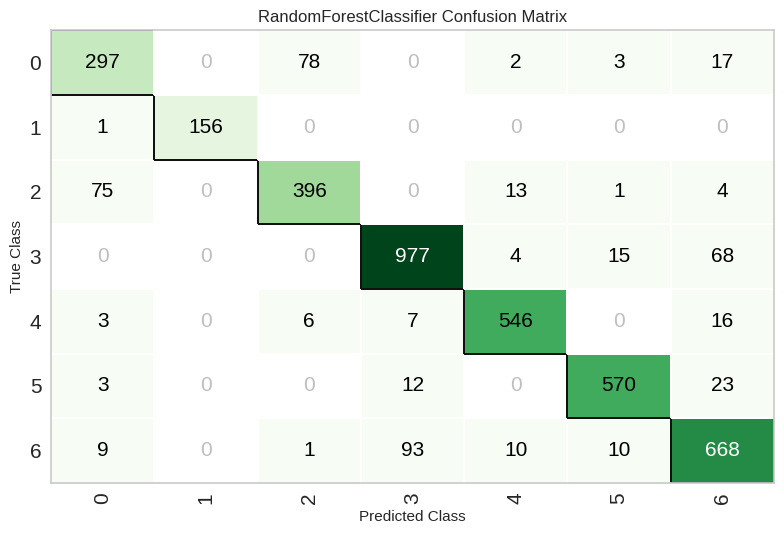

In [115]:
plot_model(rf_tuned, plot='confusion_matrix')


In [116]:
"""clf = setup(data=data,
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123,  # For reproducibility
            normalize=True,  # Standardize numerical features
            pca=True,  # Enable PCA
            pca_components=3)  # Reduce to 3 principal components
"""

"clf = setup(data=data,\n            target='Class',  # Target variable is 'Class'\n            train_size=0.7,  # 70% for training, 30% for validation\n            session_id=123,  # For reproducibility\n            normalize=True,  # Standardize numerical features\n            pca=True,  # Enable PCA\n            pca_components=3)  # Reduce to 3 principal components\n"

In [117]:
"""#show the best model and their statistics
best_model = compare_models()"""

'#show the best model and their statistics\nbest_model = compare_models()'

In [118]:
"""clf = setup(data=data,
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123,  # For reproducibility
            normalize=True,  # Standardize numerical features
            pca=True,  # Enable PCA
            pca_components=2)  # Reduce to 2 principal components"""

"clf = setup(data=data,\n            target='Class',  # Target variable is 'Class'\n            train_size=0.7,  # 70% for training, 30% for validation\n            session_id=123,  # For reproducibility\n            normalize=True,  # Standardize numerical features\n            pca=True,  # Enable PCA\n            pca_components=2)  # Reduce to 2 principal components"

In [119]:
"""#show the best model and their statistics
best_model = compare_models()"""

'#show the best model and their statistics\nbest_model = compare_models()'

In [120]:
"""# Predict and evaluate
y_pred = clf.predict(X_test_pca_optimal)
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")"""

'# Predict and evaluate\ny_pred = clf.predict(X_test_pca_optimal)\nprint("Classification Report:")\nprint(classification_report(y_test, y_pred, target_names=label_encoder.classes_))\nprint(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")'